In [1]:
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
%matplotlib inline

import cv2
import os
#from data import loadData

import tensorflow as tf
from tensorflow import keras
print("Keras", keras.__version__)
from tensorflow.keras import layers


from xml.etree import ElementTree
from xml.dom import minidom
import collections

import matplotlib as matplot
import seaborn as sns
%matplotlib inline



/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3

Keras 2.2.4-tf


# Data preparation

In [2]:
base_path = os.getcwd() + '/RoadDamageDataset/'

damageTypes=["D00", "D01", "D10", "D11", "D20", "D40", "D43", "D44"]

# govs corresponds to municipality name.
govs = ["Adachi", "Chiba", "Ichihara", "Muroran", "Nagakute", "Numazu", "Sumida"]


In [3]:
from os import listdir
from xml.etree import ElementTree
from numpy import zeros
from numpy import asarray

# Root directory of the project
ROOT_DIR = os.path.abspath("/home/eisti/Documents/ING3/DeepLearning/Projet/RoadInspector/Mask_RCNN/mrcnn")
import sys
# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
sys.path.append(os.path.join(ROOT_DIR,'samples'))  # To find local version of the library

from mrcnn import utils
from mrcnn.utils import Dataset


In [4]:
#cleaning the data 
for gov in govs:
    # define data locations
    images_dir = base_path + gov + '/JPEGImages/'
    # define annotations locations
    annotations_dir = base_path + gov + '/Annotations/'
    # we'll only consider the files with corresponding annotations
    file_list = [filename for filename in os.listdir(annotations_dir) if not filename.startswith('.')]
    a = []
    for filename in file_list:
        gov = filename.split('_')[0]
        a.append(gov)
        infile_xml = open(base_path + gov + '/Annotations/' + filename)
        tree = ElementTree.parse(infile_xml)
        #get doc's root
        root = tree.getroot()
        for obj in root.findall('.//object'):
            classe=obj.find('name').text
            if classe not in damageTypes:
                print(filename)


KeyboardInterrupt: 

In [4]:

# class that defines and loads the Damage dataset
class DamageDataset(Dataset):
    
    # load the dataset definitions
    def load_dataset(self, dataset_dir, is_train=True):
        # define the classes
        self.add_class("dataset", 1, "D00")
        self.add_class("dataset", 2, "D01")
        self.add_class("dataset", 3, "D10")
        self.add_class("dataset", 4, "D11")
        self.add_class("dataset", 5, "D20")
        self.add_class("dataset", 6, "D40")
        self.add_class("dataset", 7, "D43")
        self.add_class("dataset", 8, "D44")
        # find all images
        for gov in govs:
            # define data locations
            images_dir = base_path + gov + '/JPEGImages/'
            # define annotations locations
            annotations_dir = base_path + gov + '/Annotations/'
            # we'll only consider the files with corresponding annotations
            file_list = [filename for filename in os.listdir(annotations_dir) if not filename.startswith('.')]

            if is_train :
                file_list_kind = file_list[:int(0.8*len(file_list))]
            else:
                file_list_kind = file_list[int(0.8*len(file_list)):]

            for filename in file_list_kind:
                # extract image id
                image_id = filename.split('.')[0]
                img_path = images_dir + image_id + '.jpg'
                ann_path = annotations_dir + filename
                # add to dataset
                self.add_image('dataset', image_id=image_id, path=img_path, ann=ann_path)

    # extract bounding boxes and the respective classes from an annotation file
    def extract_boxes(self, image_file):
        gov = image_file.split('_')[0]

        img = cv2.imread(image_file.split('.')[0] + '.jpg')
        infile_xml = open(image_file)
        #load and parse the file
        tree = ElementTree.parse(infile_xml)
        #get doc's root
        root = tree.getroot()
        # extract each bounding box
        boxes = list()
        classe = list()
        for obj in root.findall('.//object'):
            classe.append(obj.find('name').text)
            box = obj.find('.//bndbox')
            xmin = int(box.find('xmin').text)
            ymin = int(box.find('ymin').text)
            xmax = int(box.find('xmax').text)
            ymax = int(box.find('ymax').text)
            coors = [xmin, ymin, xmax, ymax]
            boxes.append(coors)
            #print("extract_boxes' classes " + classe)
        #gov = root.find('.//folder').text
        width = int(root.find('.//size/width').text)
        height = int(root.find('.//size/height').text)
        return (boxes, width, height, classe)

    # load the masks for an image
    def load_mask(self, image_id):
        # get details of image
        info = self.image_info[image_id]
        # define box file location
        path = info['annotation']
        # load XML
        # print(path)
        boxes, w, h, classe = self.extract_boxes(path)
        #print("extract_boxes' classes in load " + classe)
        # create one array for all masks, each on a different channel
        masks = zeros([h, w, len(boxes)], dtype='uint8')
        # create masks
        class_ids = list()
        for i in range(len(boxes)):
            box = boxes[i]
            row_s, row_e = box[1], box[3]
            col_s, col_e = box[0], box[2]
            masks[row_s:row_e, col_s:col_e, i] = 1
            class_ids.append(self.class_names.index(classe[i]))
            #print("load_mask's classes " + str(class_ids))
        return masks, asarray(class_ids, dtype='int32')

    # load an image reference
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']


# Creation of the Train and Test datasets

In [5]:

# train set
train_set = DamageDataset()
train_set.load_dataset('/RoadDamageDataset/Adachi', is_train=True)
train_set.prepare()
print('Train: %d images' % len(train_set.image_ids))

# test/val set
test_set = DamageDataset()
test_set.load_dataset('Damage', is_train=False)
test_set.prepare()
print('Test: %d images' % len(test_set.image_ids))

Train: 7226 images
Test: 1810 images


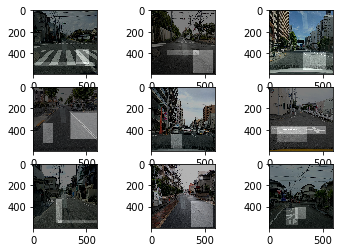

In [6]:
# plot first few images
rand = [8, 1225, 7087, 425, 7209, 6200, 732, 88, 5410]
for i in rand:
    # define subplot
    plt.subplot(330 + 1 + rand.index(i))
    # plot raw pixel data
    image = train_set.load_image(i)
    plt.imshow(image)
    # plot all masks
    mask, _ = train_set.load_mask(i)
    for j in range(mask.shape[2]):
        plt.imshow(mask[:, :, j], cmap='gray', alpha=0.3)
# show the figure
plt.show()

# show all the ‘image info‘ dictionaries

In [17]:
# enumerate all images in the dataset
for image_id in train_set.image_ids:
    # load image info
    info = train_set.image_info[image_id]
    # display on the console
    print(info)

{'id': 'Adachi_20170911102657', 'source': 'dataset', 'path': '/data/Documents/ING3/DeepLearning/Projet/RoadsInspector/RoadDamageDetector-master/RoadDamageDataset/Adachi/JPEGImages/Adachi_20170911102657.jpg', 'annotation': '/data/Documents/ING3/DeepLearning/Projet/RoadsInspector/RoadDamageDetector-master/RoadDamageDataset/Adachi/Annotations/Adachi_20170911102657.xml'}
{'id': 'Adachi_20170911103735', 'source': 'dataset', 'path': '/data/Documents/ING3/DeepLearning/Projet/RoadsInspector/RoadDamageDetector-master/RoadDamageDataset/Adachi/JPEGImages/Adachi_20170911103735.jpg', 'annotation': '/data/Documents/ING3/DeepLearning/Projet/RoadsInspector/RoadDamageDetector-master/RoadDamageDataset/Adachi/Annotations/Adachi_20170911103735.xml'}
{'id': 'Adachi_20170911103837', 'source': 'dataset', 'path': '/data/Documents/ING3/DeepLearning/Projet/RoadsInspector/RoadDamageDetector-master/RoadDamageDataset/Adachi/JPEGImages/Adachi_20170911103837.jpg', 'annotation': '/data/Documents/ING3/DeepLearning/Pro

[8 1]


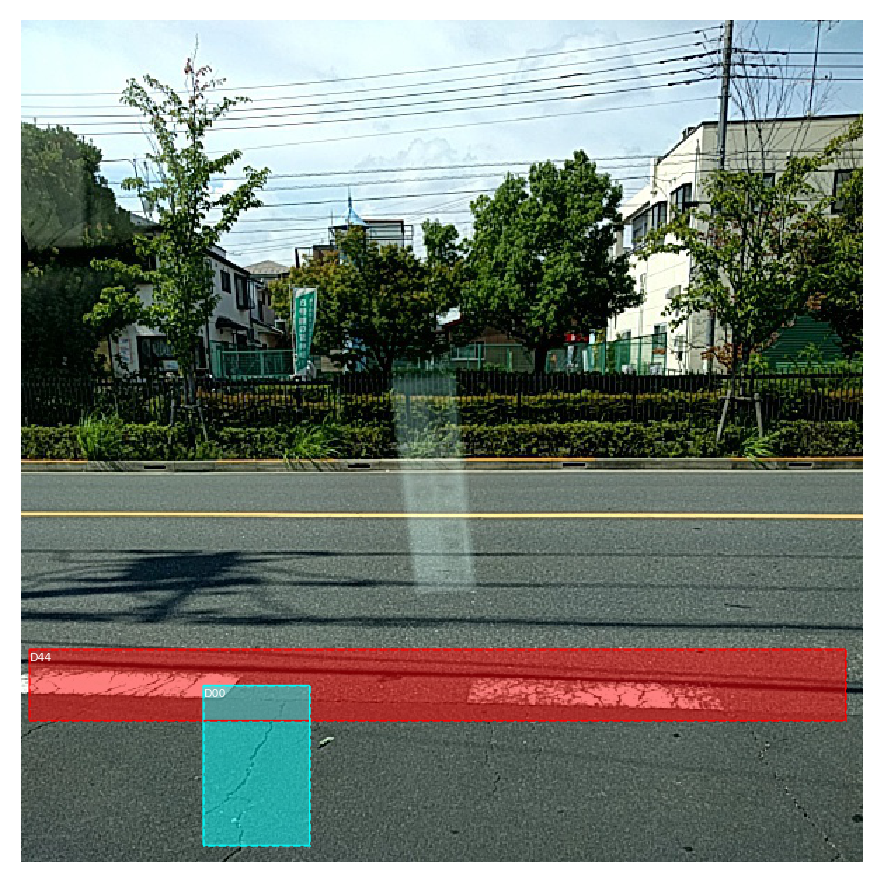

[4 8]


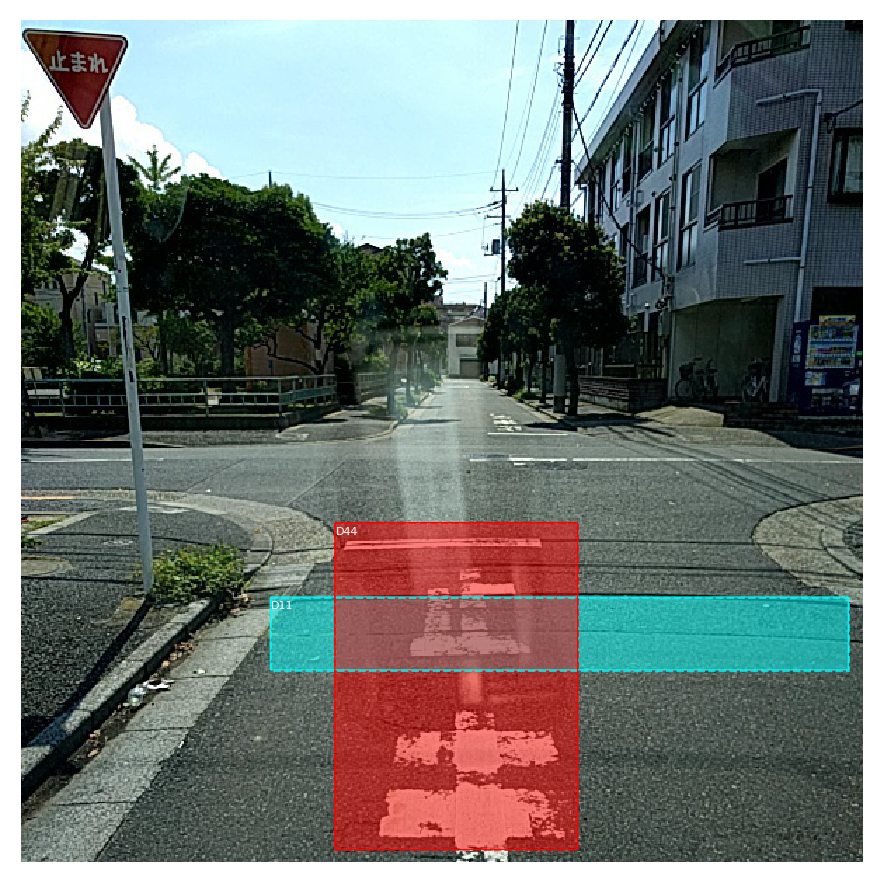

[3 8 2]


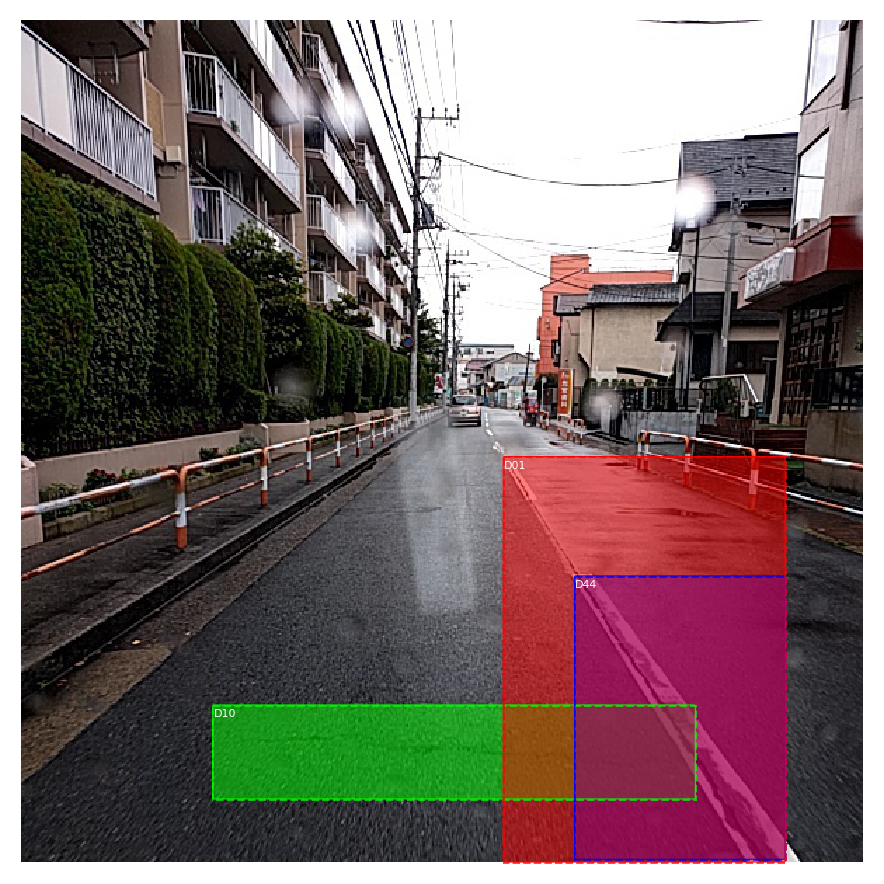

[8]


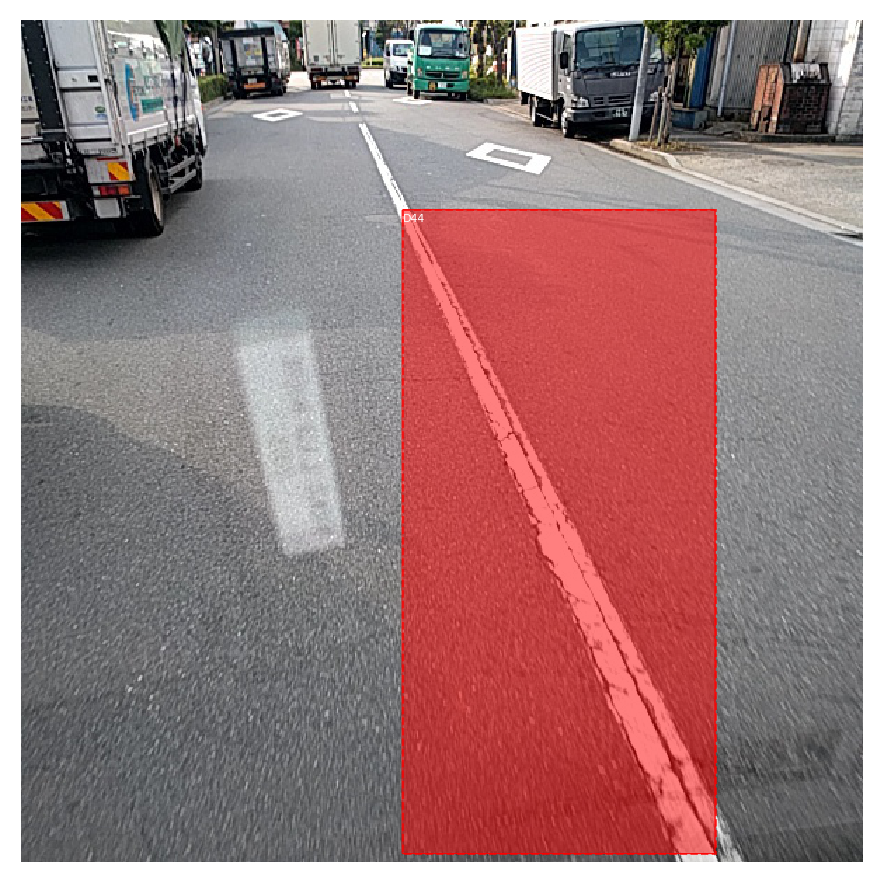

[8 2 4]


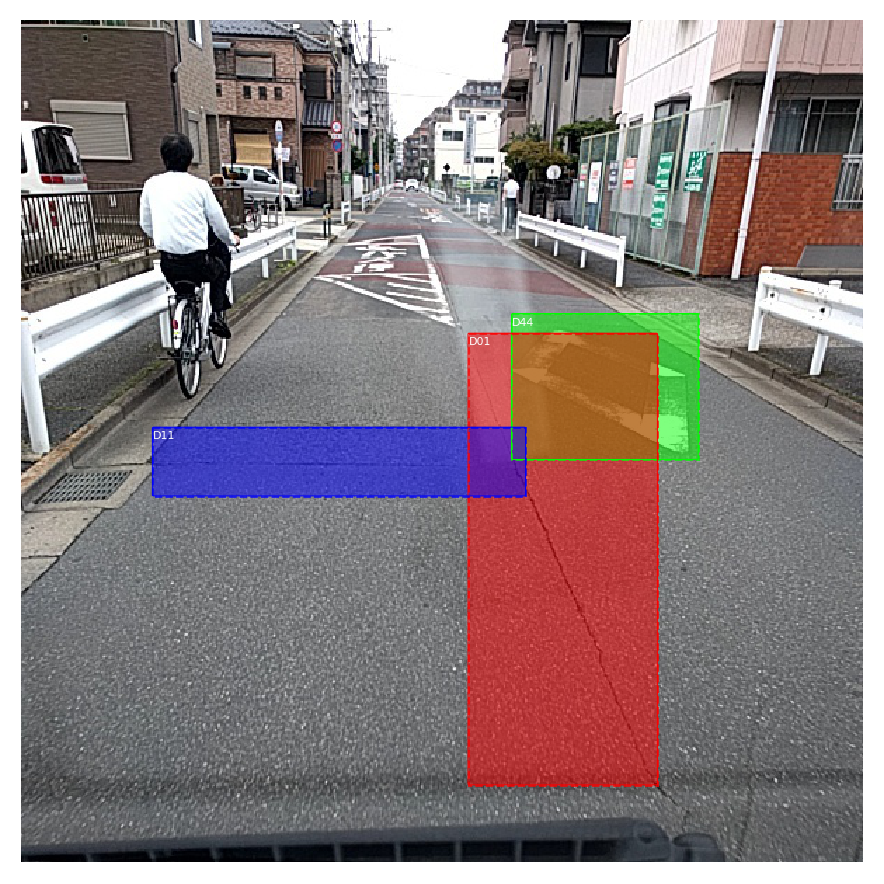

[2 8 8]


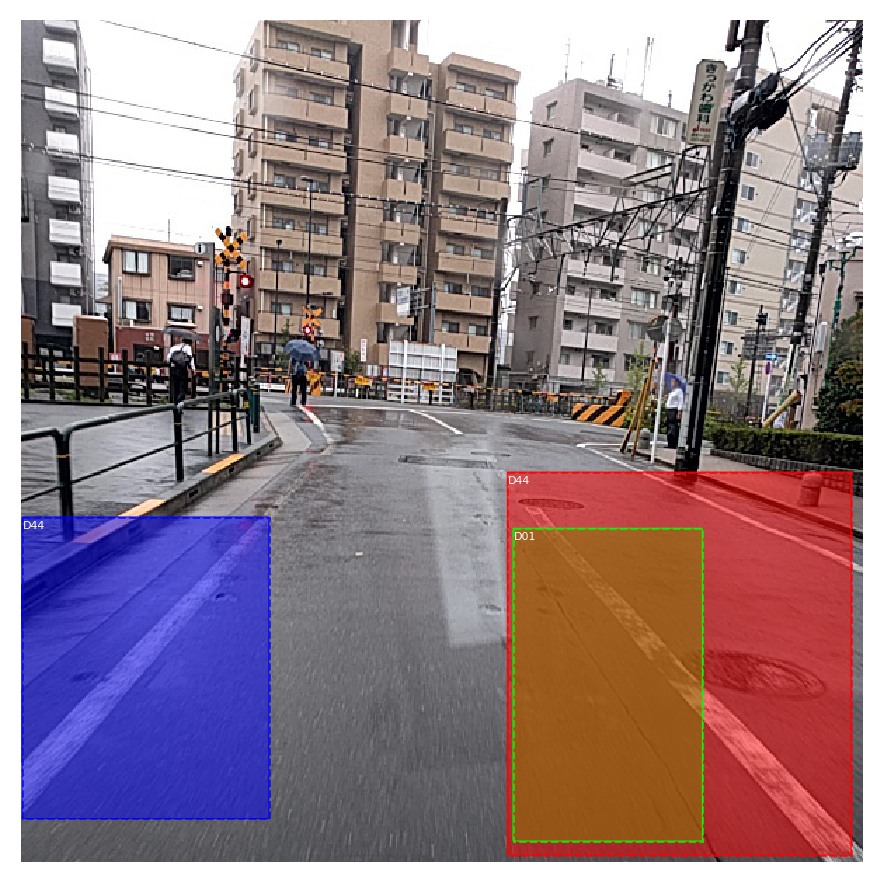

In [7]:
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes

# define image id
image_id = 75
ids = [2, 15, 90, 200, 70, 28]
for image_id in ids :   
    # load the image
    image = train_set.load_image(image_id)
    # load the masks and the class ids
    mask, class_ids = train_set.load_mask(image_id)
    print(class_ids)
    # extract bounding boxes from the masks
    bbox = extract_bboxes(mask)
    # display image with masks and bounding boxes
    display_instances(image, bbox, mask, class_ids, train_set.class_names)

# Transfert learning from Mask R-CNN pre-fitted on the MS COCO dataset

In [8]:
from mrcnn.config import Config
from mrcnn.model import MaskRCNN

Using TensorFlow backend.


In [60]:
class DamageConfig(Config):
    # give the configuration a recognizable name
    NAME = "Damage_cfg"
    # set the number of GPUs to use along with the number of images per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # number of classes
     # damage + BG
    NUM_CLASSES = 8 + 1
    # Number of training steps per epoch (for full train dataset it must be 7226)
    STEPS_PER_EPOCH = 250
    # Learning rate
    LEARNING_RATE = 0.006
    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.9
    # setting Max ground truth instances
    MAX_GT_INSTANCES = 10
# prepare config
config = DamageConfig()

In [61]:
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                21
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.006
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [31]:
#TEST

inputs = keras.Input(shape=(600, 600, 3))
x = layers.Dense(64, activation='relu')(inputs)
outputs = layers.Dense(10)(x)
model = keras.Model(inputs=inputs, outputs=outputs, name='mnist_model')
model.summary()

model.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              optimizer=keras.optimizers.RMSprop(),
              metrics=['accuracy'])

history = model.fit(train_set, train_test,
                    batch_size=4,
                    epochs=1,
                    validation_split=0.2)

test_scores = model.evaluate(x_test, y_test, verbose=2)
print('Test loss:', test_scores[0])
print('Test accuracy:', test_scores[1])

Model: "mnist_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 600, 600, 3)]     0         
_________________________________________________________________
dense_2 (Dense)              (None, 600, 600, 64)      256       
_________________________________________________________________
dense_3 (Dense)              (None, 600, 600, 10)      650       
Total params: 906
Trainable params: 906
Non-trainable params: 0
_________________________________________________________________


NameError: name 'train_test' is not defined

In [13]:
# define the model
model = MaskRCNN(mode='training', model_dir='./', config=config)
# load weights (mscoco)
model.load_weights('Mask_RCNN/mask_rcnn_coco.h5', by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead


In [14]:
# train heads with higher lr to speedup the learning
model.train(train_set, test_set, learning_rate = config.LEARNING_RATE, epochs=6, layers='heads')
history = model.keras_model.history.history


Starting at epoch 0. LR=0.006

Checkpoint Path: ./damage_cfg20200417T2332/mask_rcnn_damage_cfg_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (Tim

/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3.6/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor




/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3.6/site-packages/keras/engine/training.py:2039: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 1/6
249/250 [============================>.] - ETA: 28s - loss: 2.5483 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.9660 - mrcnn_class_loss: 0.2597 - mrcnn_bbox_loss: 0.7941 - mrcnn_mask_loss: 0.4662

/home/eisti/.virtualenvs/ENV_DEEPL/lib/python3.6/site-packages/keras/engine/training.py:2197: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


250/250 [==============================] - 7667s 31s/step - loss: 2.5528 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 0.9704 - mrcnn_class_loss: 0.2592 - mrcnn_bbox_loss: 0.7937 - mrcnn_mask_loss: 0.4657 - val_loss: 2.2332 - val_rpn_class_loss: 0.0515 - val_rpn_bbox_loss: 0.9859 - val_mrcnn_class_loss: 0.2118 - val_mrcnn_bbox_loss: 0.5783 - val_mrcnn_mask_loss: 0.4056
Epoch 2/6
250/250 [==============================] - 8903s 36s/step - loss: 2.3191 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 1.0399 - mrcnn_class_loss: 0.2399 - mrcnn_bbox_loss: 0.5914 - mrcnn_mask_loss: 0.3977 - val_loss: 1.9120 - val_rpn_class_loss: 0.0700 - val_rpn_bbox_loss: 0.6933 - val_mrcnn_class_loss: 0.1595 - val_mrcnn_bbox_loss: 0.5633 - val_mrcnn_mask_loss: 0.4258
Epoch 3/6
250/250 [==============================] - 8981s 36s/step - loss: 2.1608 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.9098 - mrcnn_class_loss: 0.2665 - mrcnn_bbox_loss: 0.5442 - mrcnn_mask_loss: 0.3935 - val_loss: 2.6794 - val_rpn_class_loss: 0.

In [15]:
# saving weigths
model_path = 'trainedModels/custom/mask_rcnn_'  + '1840' + '.h5'
model.keras_model.save_weights(model_path)

# Training history visualization

In [21]:

history = model.fit(x, y, validation_split=0.25, epochs=4, batch_size=16, verbose=1)

# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


AttributeError: 'MaskRCNN' object has no attribute 'fit'

# Prediction

In [9]:
class PredConfig(Config):
    # give the configuration a recognizable name
    NAME = "Damage_cfg"
    # set the number of GPUs to use along with the number of images per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # number of classes
     # damage + BG
    NUM_CLASSES = 8 + 1
    # Number of training steps per epoch (for full train dataset it must be 7226)
    STEPS_PER_EPOCH = 250
    # Learning rate
    LEARNING_RATE = 0.006
    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.5
    # setting Max ground truth instances
    MAX_GT_INSTANCES = 10
# prepare config
configp = PredConfig()

In [10]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
#Loading the model in the inference mode
modelp = MaskRCNN(mode="inference", config=configp, model_dir='./')
# loading the trained weights o the custom dataset
modelp.load_weights('trainedModels/custom/mask_rcnn_1640.h5', by_name=True)






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


image ID: dataset.Muroran_20170906143255 (900) /data/Documents/ING3/DeepLearning/Projet/RoadsInspector/RoadDamageDataset/Muroran/JPEGImages/Muroran_20170906143255.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 21)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


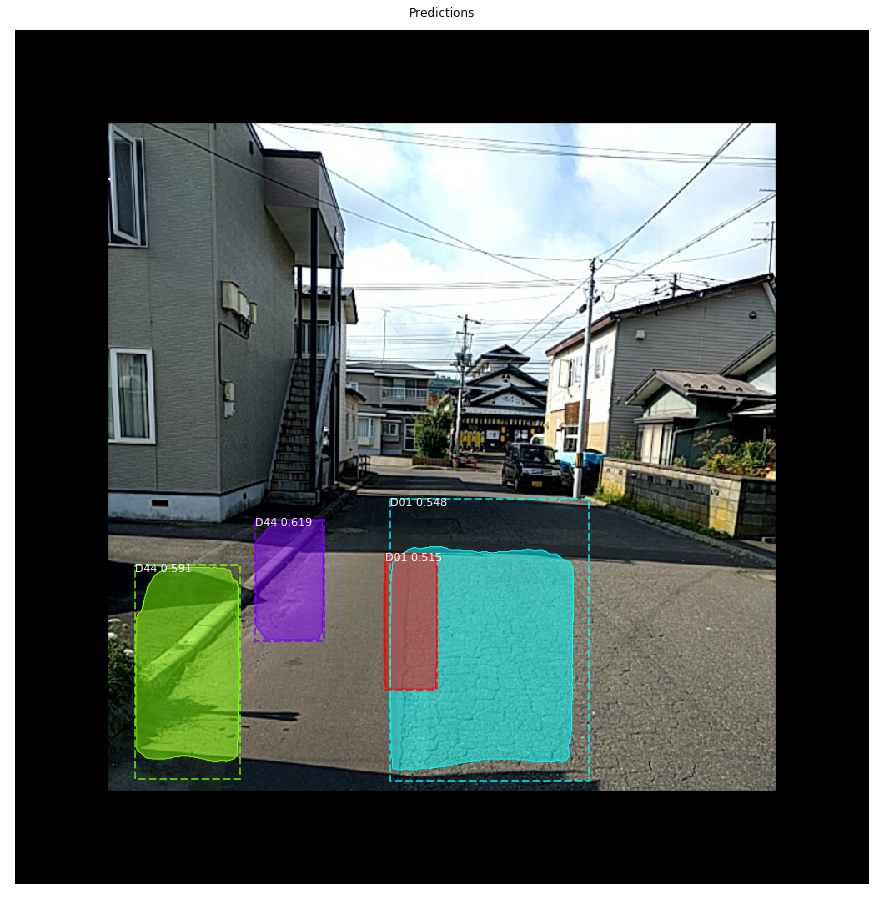

In [13]:
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes
from mrcnn import model as modellib

image_id = 900
image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(test_set, configp, image_id, use_mini_mask=False)
info = test_set.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       test_set.image_reference(image_id)))
# Run object detection
results = modelp.detect([image], verbose=1)
# Display results

r = results[0]
display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            test_set.class_names, r['scores'], 
                            title="Predictions")

# Other way to predict (doesn't work rn)

In [45]:
from numpy import expand_dims
from mrcnn.utils import compute_ap
from mrcnn.model import load_image_gt
from mrcnn.model import mold_image

In [47]:
class PredictionConfig(Config):
    # define the name of the configuration
    NAME = "damages_cfg"
    # number of classes (background + damages)
    NUM_CLASSES = 1 + 8
    # simplify GPU config
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

# create config
cfg = PredictionConfig()
# define the model
modelp = MaskRCNN(mode='inference', model_dir='./', config=cfg)
# load model weights
modelp.load_weights('damage_cfg20200417T0256/mask_rcnn_damage_cfg_0005.h5', by_name=True)

# Evaluation (super super slow)

In [48]:
# evaluate with the mAP
def evaluate_model(dataset, model, cfg):
    APs = list()
    for image_id in dataset.image_ids:
        # load image, bounding boxes and masks for the image id
        image, image_meta, gt_class_id, gt_bbox, gt_mask = load_image_gt(dataset, cfg, image_id, use_mini_mask=False)
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        # convert image into one sample
        sample = expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0)
        # extract results for first sample
        r = yhat[0]
        # calculate statistics, including AP
        AP, _, _, _ = compute_ap(gt_bbox, gt_class_id, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'])
        # store
        APs.append(AP)
    # calculate the mean AP across all images
    mAP = mean(APs)
    return mAP

In [ ]:
# evaluate model on training dataset
train_mAP = evaluate_model(train_set, modelp, cfg)
print("Train mAP: %.3f" % train_mAP)
# evaluate model on test dataset
test_mAP = evaluate_model(test_set, modelp, cfg)
print("Test mAP: %.3f" % test_mAP)

KeyboardInterrupt: 